In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import pickle
import warnings
warnings.filterwarnings("ignore")
sns.set()

In [25]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from My_Pred_Modelling import classification_modelling, modelling, models_graph
from My_Pred_Modelling import param_to_model_transform

In [37]:
models = [RandomForestClassifier(n_estimators=110, max_depth=4, min_samples_split=8, min_samples_leaf=1, random_state=42),
           XGBClassifier(n_estimators=240, learning_rate=0.04, max_depth=2, random_state=42),
           KNeighborsClassifier(n_neighbors=4, leaf_size=1, p=1, weights='distance'),
           AdaBoostClassifier(n_estimators=150, learning_rate=0.05, base_estimator=DecisionTreeClassifier(max_depth=1), random_state=42),
           GradientBoostingClassifier(n_estimators=150, learning_rate=0.05, max_depth=1, random_state=42)]

In [3]:
df = pd.read_csv('L_Prep_State.csv', index_col=0)
df.STATE = df.STATE.replace({'norm': 0, 'AC': 1, 'SCC': 2})
df.head()

,A1BG,A1CF,A2M,A2ML1,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL2,...,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1,ZZZ3,STATE
GTEX-111CU,6.282829,0.187227,16.459309,1.390586,9.284774,1.817905,8.861321,9.356633,7.162157,0.405928,...,6.519220,5.774152,8.752136,10.276568,0.395912,9.567469,13.064981,10.710016,9.178765,0
GTEX-111FC,6.459492,0.386816,16.357314,1.462766,8.363233,2.132000,9.006019,8.859413,6.869540,0.912104,...,6.302100,5.820590,8.343859,10.116765,0.997971,9.816011,12.760873,10.042366,9.167625,0
GTEX-111VG,7.143432,-0.003366,17.293667,3.257567,9.789358,1.989310,9.090267,9.029279,6.511335,2.000838,...,5.736464,5.852467,8.692399,9.894538,1.543979,9.809940,13.636654,10.698651,8.804904,0
GTEX-111YS,6.464637,0.061339,15.854521,1.953561,8.419853,1.315828,8.923156,9.249810,9.213866,0.004093,...,6.219143,5.812366,8.676940,10.376354,0.589715,10.132188,12.351264,10.884633,9.129941,0
GTEX-1122O,6.826894,-0.094578,16.039283,2.107355,8.505655,2.619394,9.076225,9.249061,8.817053,-0.682806,...,6.624728,5.650416,8.575410,10.407757,1.191774,9.888598,12.661172,10.864600,8.970880,0


In [4]:
with open('Bio_final_norm_tumor.pkl', 'rb') as file:
    norm_tumor = pickle.load(file)
with open('Bio_final_AC_SCC.pkl', 'rb') as file:
    AC_SCC = list(pickle.load(file))
len(norm_tumor), len(AC_SCC)  # (10, 12)

(10, 12)

### ***Detecting of norm_tumor***

In [7]:
X = df[norm_tumor] # (1706, 10)
y_norm_tumor = df.STATE.replace({2: 1})
y_norm_tumor.value_counts()

STATE
1    1018
0     688
Name: count, dtype: int64

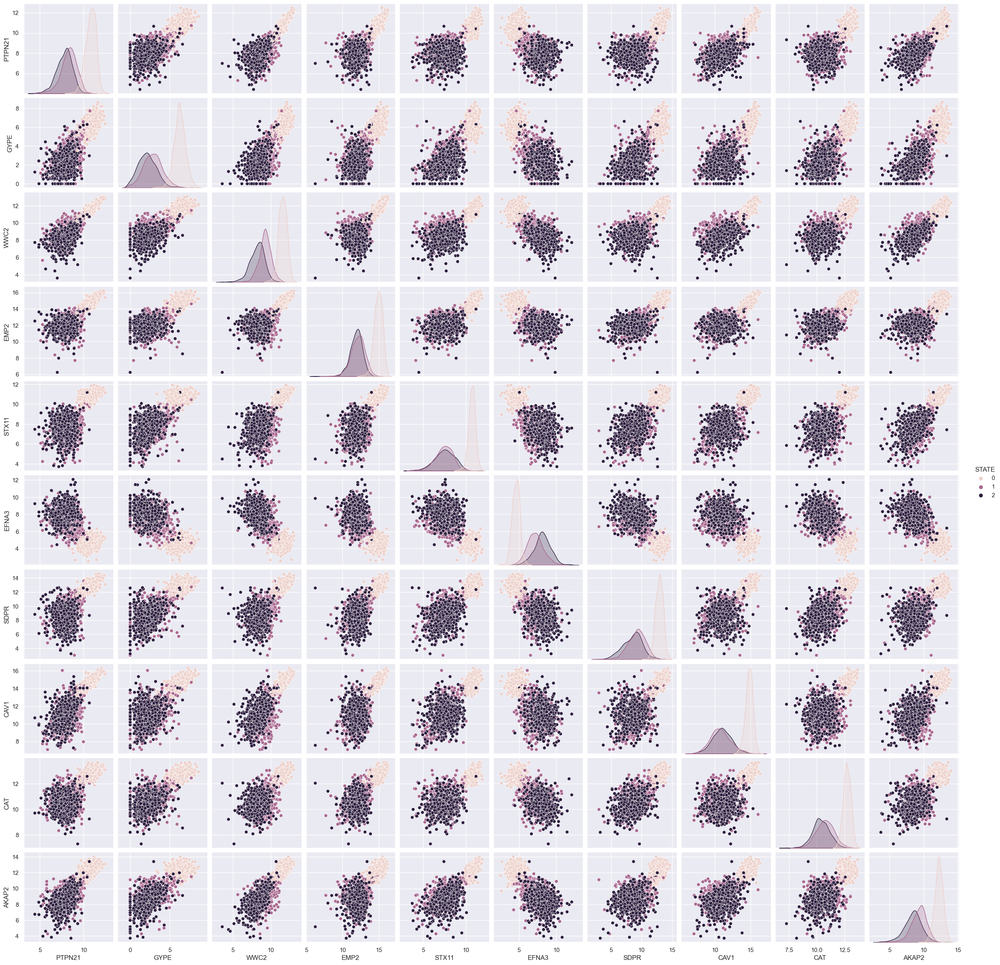

In [22]:
sns.pairplot(df[norm_tumor + ['STATE']], hue='STATE')
plt.savefig('Pairplot_norm_tumor_State.jpeg', format='jpeg');

In [32]:
param_Ada1 = {'n_estimators': list(range(150, 250, 10)),
                  'learning_rate': np.arange(0.05, 0.1, 0.01).round(2).tolist(),
                  'base_estimator': [None, DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=2)]}
param_XG1 = {'n_estimators': list(range(100, 250, 20)),
                 'learning_rate': np.arange(0.01, 0.1, 0.01).round(2).tolist(),
                 'max_depth': [1, 2, 3]}
param_RF1 = {'n_estimators': list(range(100, 155, 10)),
                 'max_depth': [3, 4, 5],
                 'min_samples_split': list(range(5, 10)),
                 'min_samples_leaf': [1, 2, 3]}
param_GB1 = {'n_estimators': list(range(150, 200, 10)),
                 'learning_rate': np.arange(0.05, 0.15, 0.01).round(2).tolist(),
                 'max_depth': [1, 2, 3]}
param_KN1 = {'n_neighbors': list(range(1,8)),
                'leaf_size': list(range(1,5)),
                 'weights': ['uniform', 'distance'],
                 'p': [1, 2]}  # 1 for Manhattan distance, 2 for Euclidean distance
params1 = [param_RF1, param_XG1, param_KN1, param_Ada1, param_GB1]

In [33]:
res1 = classification_modelling(X, y_norm_tumor, params=params1)
models1 = param_to_model_transform(res1)

Model:  RandomForestClassifier
Best Hyperparameters:  {'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 110}
Accuracy on Test Data: 0.98830
Model:  XGBClassifier
Best Hyperparameters:  {'learning_rate': 0.04, 'max_depth': 2, 'n_estimators': 240}
Accuracy on Test Data: 0.99123
Model:  KNeighborsClassifier
Best Hyperparameters:  {'leaf_size': 1, 'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
Accuracy on Test Data: 0.98830
Model:  AdaBoostClassifier
Best Hyperparameters:  {'base_estimator': DecisionTreeClassifier(max_depth=1), 'learning_rate': 0.05, 'n_estimators': 150}
Accuracy on Test Data: 0.99123
Model:  GradientBoostingClassifier
Best Hyperparameters:  {'learning_rate': 0.05, 'max_depth': 1, 'n_estimators': 150}
Accuracy on Test Data: 0.99415


{'RandomForestClassifier': {'max_depth': 4,
  'min_samples_leaf': 1,
  'min_samples_split': 8,
  'n_estimators': 110,
  'accuracy': 0.9883040935672515},
 'XGBClassifier': {'learning_rate': 0.04,
  'max_depth': 2,
  'n_estimators': 240,
  'accuracy': 0.9912280701754386},
 'KNeighborsClassifier': {'leaf_size': 1,
  'n_neighbors': 4,
  'p': 1,
  'weights': 'distance',
  'accuracy': 0.9883040935672515},
 'AdaBoostClassifier': {'base_estimator': DecisionTreeClassifier(max_depth=1),
  'learning_rate': 0.05,
  'n_estimators': 150,
  'accuracy': 0.9912280701754386},
 'GradientBoostingClassifier': {'learning_rate': 0.05,
  'max_depth': 1,
  'n_estimators': 150,
  'accuracy': 0.9941520467836257}}

In [38]:
model_norm_tumor = modelling(X, y_norm_tumor, models)
model_norm_tumor

,mean_score,std_score
AdaBoostClassifier,99.47,0.22
XGBClassifier,99.41,0.49
KNeighborsClassifier,99.41,0.19
GradientBoostingClassifier,99.35,0.50
RandomForestClassifier,99.18,0.47


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


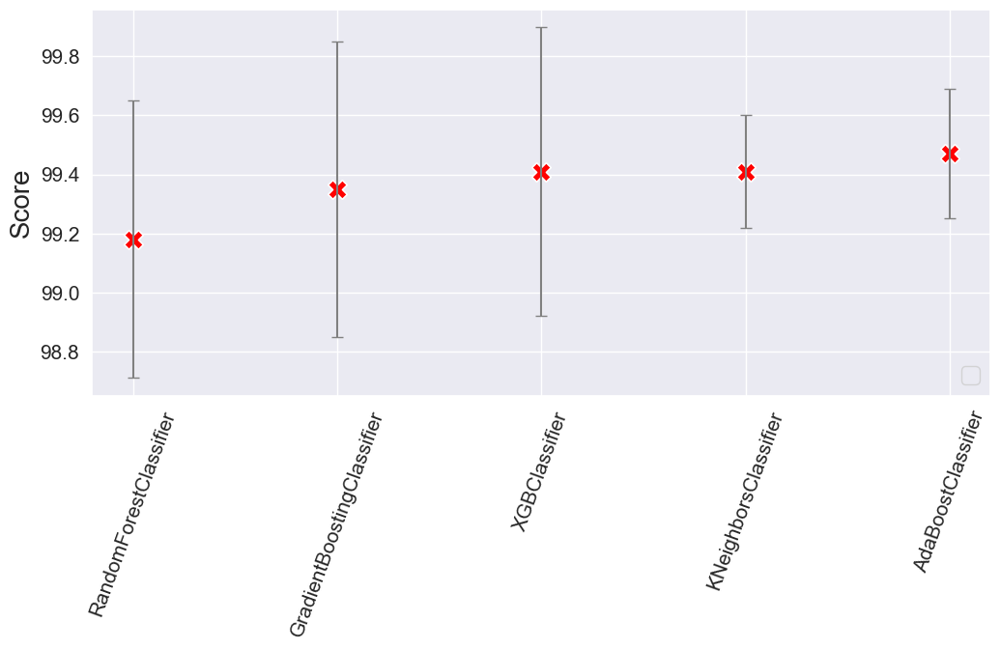

In [41]:
models_graph(model_norm_tumor, 'FS10_norm_tumor');

So we got very good values for selected 10 features, and there is no need to consider a larger set of features.

### ***Detecting of AC_SCC***

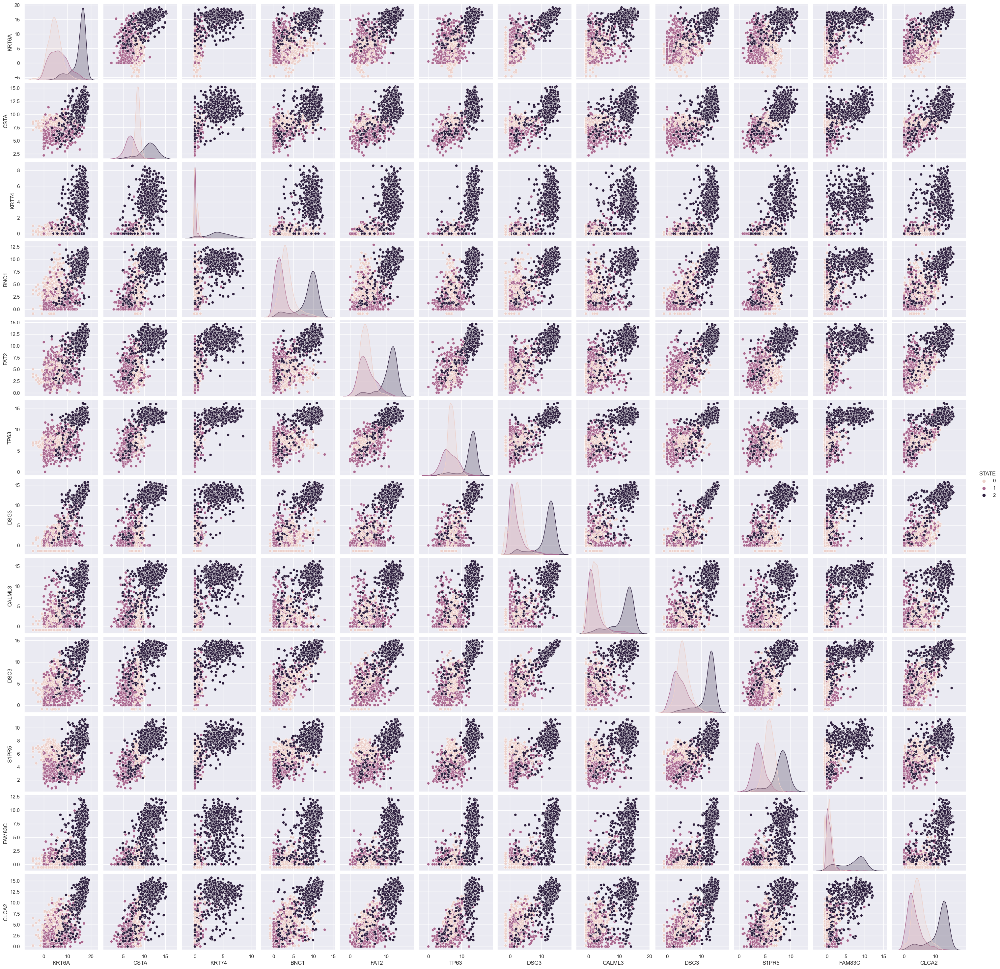

In [48]:
sns.pairplot(df[AC_SCC + ['STATE']], hue='STATE')
plt.savefig('Pairplot_AC_SCC_State.jpeg', format='jpeg');

In [5]:
X_AC_SCC_12 = df[df.STATE != 0] # (1018, 12)
X_AC_SCC_12 = X_AC_SCC_12[AC_SCC] # (1018, 12)
y_AC_SCC = df.STATE[df.STATE != 0] # (1018,)
X_AC_SCC_12.shape, y_AC_SCC.shape # (1018, 12), (1018,)

((1018, 12), (1018,))

In [6]:
y_AC_SCC = y_AC_SCC.replace({1: 0, 2: 1})
y_AC_SCC.value_counts()

STATE
0    517
1    501
Name: count, dtype: int64

In [7]:
param_Ada2 = {'n_estimators': list(range(150, 250, 10)),
                  'learning_rate': np.arange(0.01, 0.11, 0.01).round(2).tolist(),
                  'base_estimator': [None, DecisionTreeClassifier(max_depth=1), DecisionTreeClassifier(max_depth=2)]}
param_XG2 = {'n_estimators': list(range(150, 220, 10)),
                 'learning_rate': np.arange(0.05, 0.1, 0.01).round(2).tolist(),
                 'max_depth': [3, 5, 7]}
param_RF2= {'n_estimators': list(range(30, 100, 10)),
                 'max_depth': list(range(5, 12, 2)),
                 'min_samples_split': list(range(10, 20, 2)),
                 'min_samples_leaf': [2, 3, 5]}
param_GB2 = {'n_estimators': list(range(100, 210, 10)),
                 'learning_rate': np.arange(0.05, 0.15, 0.01).round(2).tolist(),
                 'max_depth': list(range(5,10))}
param_KN2 = {'n_neighbors': list(range(1,8)),
                'leaf_size': list(range(1,5)),
                 'weights': ['uniform', 'distance'],
                 'p': [1, 2]}  # 1 for Manhattan distance, 2 for Euclidean distance
params2 = [param_RF2, param_XG2, param_KN2, param_Ada2, param_GB2]

In [94]:
# Selecting the optimal model hyperparameters and save the into the object
res_AC_SCC_12 = classification_modelling(X_AC_SCC_12, y_AC_SCC, params=params2)
pickle.dump(res_AC_SCC_12, open('res_AC_SCC_12.pkl', 'wb'))

Model:  RandomForestClassifier
Best Hyperparameters:  {'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 30}
Accuracy on Test Data: 0.96569
Model:  XGBClassifier
Best Hyperparameters:  {'learning_rate': 0.08, 'max_depth': 5, 'n_estimators': 150}
Accuracy on Test Data: 0.96078
Model:  KNeighborsClassifier
Best Hyperparameters:  {'leaf_size': 1, 'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
Accuracy on Test Data: 0.97059
Model:  AdaBoostClassifier
Best Hyperparameters:  {'base_estimator': DecisionTreeClassifier(max_depth=1), 'learning_rate': 0.09, 'n_estimators': 240}
Accuracy on Test Data: 0.96078
Model:  GradientBoostingClassifier
Best Hyperparameters:  {'learning_rate': 0.14, 'max_depth': 6, 'n_estimators': 140}
Accuracy on Test Data: 0.95588


In [9]:
with open('res_AC_SCC_12.pkl', 'rb') as file:
    res_AC_SCC_12 = pickle.load(file)
res_AC_SCC_12

{'RandomForestClassifier': {'max_depth': 5,
  'min_samples_leaf': 2,
  'min_samples_split': 10,
  'n_estimators': 30,
  'accuracy': 0.9656862745098039},
 'XGBClassifier': {'learning_rate': 0.08,
  'max_depth': 5,
  'n_estimators': 150,
  'accuracy': 0.9607843137254902},
 'KNeighborsClassifier': {'leaf_size': 1,
  'n_neighbors': 3,
  'p': 2,
  'weights': 'uniform',
  'accuracy': 0.9705882352941176},
 'AdaBoostClassifier': {'base_estimator': DecisionTreeClassifier(max_depth=1),
  'learning_rate': 0.09,
  'n_estimators': 240,
  'accuracy': 0.9607843137254902},
 'GradientBoostingClassifier': {'learning_rate': 0.14,
  'max_depth': 6,
  'n_estimators': 140,
  'accuracy': 0.9558823529411765}}

In [11]:
# Transform the result to the convenient form for modelling
models2 = param_to_model_transform(res_AC_SCC_12)
model_AC_SCC_12 = modelling(X_AC_SCC_12, y_AC_SCC, models2)
model_AC_SCC_12

,mean_score,std_score
XGBClassifier,94.90,2.06
KNeighborsClassifier,94.31,2.18
GradientBoostingClassifier,94.31,2.30
RandomForestClassifier,94.11,2.12
AdaBoostClassifier,94.11,2.05


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


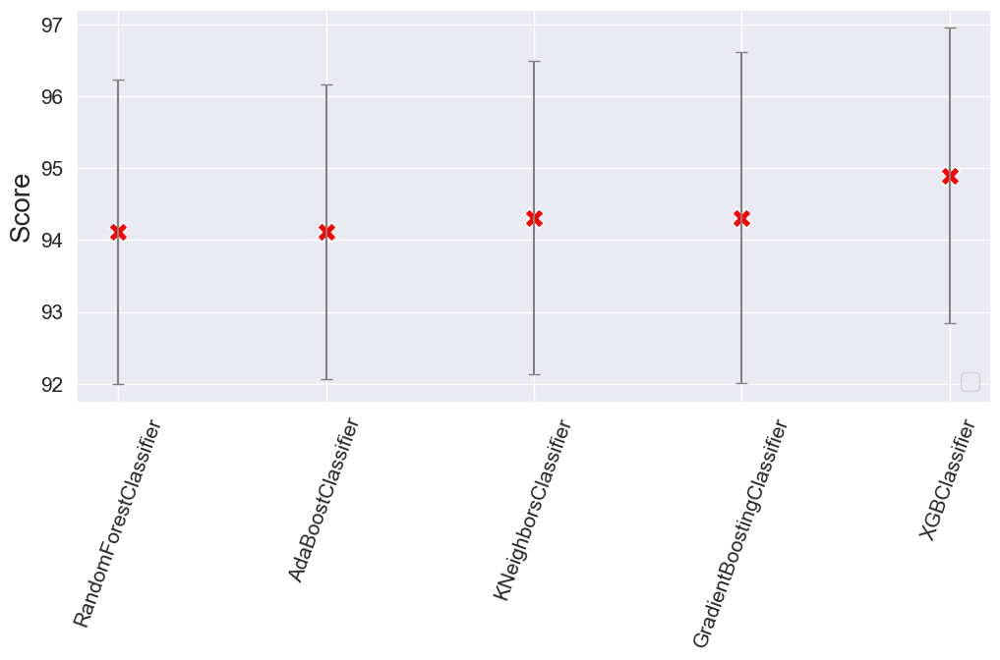

In [14]:
models_graph(model_AC_SCC_12, 'FS12_AC_SCC');

There are not as good results as in the case of detecting humor.
Let's try to  use the list with 32 features.

In [15]:
with open('Bio_union_AC_SCC.pkl', 'rb') as file:
    AC_SCC_32 = list(pickle.load(file))
len(AC_SCC_32)

32

In [19]:
X_AC_SCC_32 = df[df.STATE != 0] # (1018, 12)
X_AC_SCC_32 = X_AC_SCC_32[AC_SCC_32] # (1018, 12)
model_AC_SCC_32 = modelling(X_AC_SCC_32, y_AC_SCC, models2)
model_AC_SCC_32

,mean_score,std_score
KNeighborsClassifier,95.58,1.88
RandomForestClassifier,95.39,1.71
AdaBoostClassifier,95.29,1.68
GradientBoostingClassifier,95.29,1.92
XGBClassifier,95.09,1.58


In [20]:
res_AC_SCC_32 = classification_modelling(X_AC_SCC_32, y_AC_SCC, params=params2)
pickle.dump(res_AC_SCC_32, open('res_AC_SCC_32.pkl', 'wb'))

Model:  RandomForestClassifier
Best Hyperparameters:  {'max_depth': 11, 'min_samples_leaf': 2, 'min_samples_split': 16, 'n_estimators': 30}
Accuracy on Test Data: 0.97549
Model:  XGBClassifier
Best Hyperparameters:  {'learning_rate': 0.06, 'max_depth': 5, 'n_estimators': 180}
Accuracy on Test Data: 0.98039
Model:  KNeighborsClassifier
Best Hyperparameters:  {'leaf_size': 1, 'n_neighbors': 6, 'p': 1, 'weights': 'distance'}
Accuracy on Test Data: 0.97549
Model:  AdaBoostClassifier
Best Hyperparameters:  {'base_estimator': DecisionTreeClassifier(max_depth=2), 'learning_rate': 0.02, 'n_estimators': 210}
Accuracy on Test Data: 0.97059
Model:  GradientBoostingClassifier
Best Hyperparameters:  {'learning_rate': 0.12, 'max_depth': 5, 'n_estimators': 100}
Accuracy on Test Data: 0.98039


In [21]:
models3 = param_to_model_transform(res_AC_SCC_32)
model_AC_SCC_32 = modelling(X_AC_SCC_32, y_AC_SCC, models3)
model_AC_SCC_32

,mean_score,std_score
KNeighborsClassifier,95.58,1.88
RandomForestClassifier,95.19,1.84
GradientBoostingClassifier,95.19,1.94
XGBClassifier,95.09,1.51
AdaBoostClassifier,94.99,1.94


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


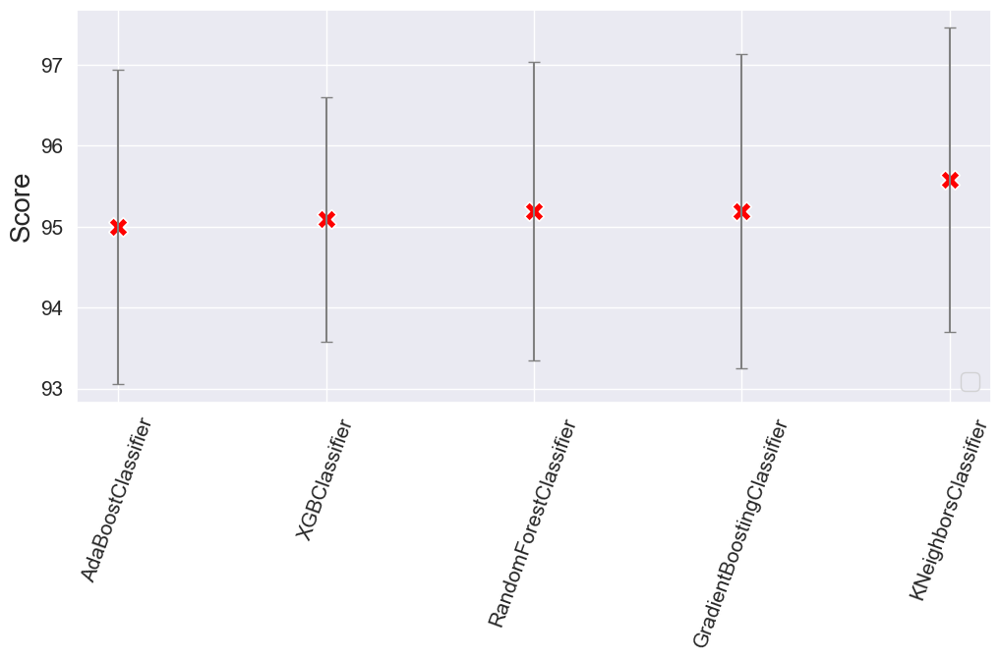

In [22]:
models_graph(model_AC_SCC_32, 'FS32_AC_SCC');